In [16]:
!rm -r /media/elijah/T7/ds000117-mri-streaming/

In [17]:
import os
import numpy as np
import pandas as pd
from tqdm.autonotebook import tqdm
from sklearn.preprocessing import LabelEncoder
import nibabel as nib
from nilearn import image
from streaming import MDSWriter
import argparse

# Define the schema for fMRI data
schema = {
    'func': 'ndarray:float32',  # assuming the shape of fMRI data
    'label': 'ndarray:int32',
    'subject': 'str',
    # 'anat': 'ndarray:float32',
    'affine': 'ndarray:float32'
}

def load_file_info(bids_path):
    file_data = []
    for subject_dir in os.listdir(bids_path):
        full_subject_dir = os.path.join(bids_path, subject_dir)
        if subject_dir.startswith('sub-'):
            for session_dir in os.listdir(full_subject_dir):
                if session_dir.startswith('ses-mri'):
                    func_dir = os.path.join(full_subject_dir, session_dir, 'func')
                    # anat_dir = os.path.join(full_subject_dir, session_dir, 'anat')
                    for file in os.listdir(func_dir):
                        if file.endswith('_bold.nii.gz'):
                            func_path = os.path.join(func_dir, file)
                            events_path = func_path.replace('_bold.nii.gz', '_events.tsv')
                            # anat_path = os.path.join(anat_dir, f"{subject_dir}_{session_dir}_T1w.nii.gz")
                            if os.path.exists(events_path):
                                file_data.append({
                                    'subject': subject_dir.split('-')[-1],
                                    'func_path': func_path,
                                    'events_path': events_path,
                                    # 'anat_path': anat_path
                                })
    return pd.DataFrame(file_data)

def load_subject_data(events_path, encoder):
    events_df = pd.read_csv(events_path, sep='\t')
    session_data = []
    for idx, event in events_df.iterrows():
        session_data.append({
            'start': event['onset'],
            'duration': event['duration'] if 'duration' in event else 1.0,
            'label': event['stim_type'],
        })
    df = pd.DataFrame(session_data)
    df['label'] = encoder.transform(df['label'])
    return df

def create_label_vector(events, sfreq, start_sample, segment_length):
    label_vector = np.zeros(segment_length, dtype=int)
    for event in events:
        event_start_sample = int(event['start'] * sfreq)
        event_end_sample = event_start_sample + int(event['duration'] * sfreq)
        event_label = event['label']
        
        for i in range(segment_length):
            sample_index = start_sample + i
            if event_start_sample <= sample_index < event_end_sample:
                label_vector[i] = event_label
                
    return label_vector

def preprocess_file(file_info, encoder, fixed_length=2048, transform=None):
    func_img = nib.load(file_info['func_path'])
    # anat_img = nib.load(file_info['anat_path'])
    affine = func_img.affine
    tr = func_img.header.get_zooms()[3]
    sfreq = 1.0 / tr
    new_len = int(fixed_length * sfreq)
    
    print(f"freq = {sfreq}\t tr = {tr}")
    func_data = func_img.get_fdata()
    total_samples = func_data.shape[3]
    subject = file_info['subject']

    events = load_subject_data(file_info['events_path'], encoder).to_dict('records')

    for start in range(0, total_samples, new_len):
        end = min(start + new_len, total_samples)  # Ensure the last segment is not skipped

        func_segment = func_data[..., start:end]
        if transform:
            func_segment = transform(func_segment)

        segment_length = end - start
        label_vector = create_label_vector(events, sfreq, start, segment_length)
        
        yield {
            'func': func_segment.astype(np.float32),
            'label': label_vector.astype(np.int32),
            'subject': subject,
            # 'anat': anat_img.get_fdata().astype(np.float32),
            'affine': affine.astype(np.float32),
            'new_len': new_len,
        }

def fit_label_encoder(bids_path):
    all_labels = []
    for subject_dir in os.listdir(bids_path):
        full_subject_dir = os.path.join(bids_path, subject_dir)
        if subject_dir.startswith('sub-'):
            for session_dir in os.listdir(full_subject_dir):
                if session_dir.startswith('ses-mri'):
                    func_dir = os.path.join(full_subject_dir, session_dir, 'func')
                    for file in os.listdir(func_dir):
                        if file.endswith('_events.tsv'):
                            events_path = os.path.join(func_dir, file)
                            if os.path.exists(events_path):
                                events_df = pd.read_csv(events_path, sep='\t')
                                all_labels.extend(events_df['stim_type'].values)
    encoder = LabelEncoder()
    encoder.fit(all_labels)
    return encoder

def data_generator(bids_path, fixed_length=2048, transform=None):
    encoder = fit_label_encoder(bids_path)
    print(encoder.classes_)
    file_info_df = load_file_info(bids_path)
    for idx in tqdm(range(len(file_info_df))):
        file_info = file_info_df.iloc[idx]
        segments = preprocess_file(file_info, encoder, fixed_length=fixed_length, transform=transform)
        if segments:
            for segment in segments:
                yield segment

def pad_sequence(sequences, max_len, pad_value=0):
    padded_sequences = np.full((len(sequences), *sequences[0].shape[:-1], max_len), pad_value, dtype=sequences[0].dtype)
    for i, seq in enumerate(sequences):
        length = seq.shape[-1]
        padded_sequences[i, ..., :length] = seq
    return padded_sequences

def collate_fn(batch, seq_len=2048):
    func = pad_sequence([batch['func']], seq_len, pad_value=-1)[0]
    label = pad_sequence([batch['label']], seq_len, pad_value=-1)[0]
    subject = batch['subject']
    affine = batch['affine']

    return {
        'func': func,
        'label': label,
        'subject': subject,
        'affine': affine
    }

def main(args):
    bids_path = args['bids_path']
    output_path = args['output_path']
    fixed_length = args['fixed_length']
    transform = None  # Placeholder for any transformation function if needed

    with MDSWriter(out=output_path, columns=schema) as out:
        for data in data_generator(bids_path, fixed_length=fixed_length, transform=transform):
            batched_data = collate_fn(data, seq_len=data['new_len'])
            out.write(batched_data)


In [18]:

args = {'bids_path':'/media/elijah/T7/ds000117-download/',
        'output_path': '/media/elijah/T7/ds000117-mri-streaming/',
        'fixed_length':256,
       }

# args = parser.parse_args()
main(args)
# --bids_path /media/elijah/T7/ds000117-download/ --output_path /media/elijah/T7/ds000117-mri-streaming/

['FAMOUS' 'SCRAMBLED' 'UNFAMILIAR' 'nan']


  0%|          | 0/144 [00:00<?, ?it/s]

freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 tr = 2.0
freq = 0.5	 t

In [ ]:
a

In [1]:
import numpy as np

In [2]:
!ls

'blank_04_cnn (2).ipynb'   lightning_logs		  pyproject.toml
 brain_slices.gif	   model_conv3d_V1_0687.pt	  README.md
 data			   MRI.ipynb			  scripts
 Demo_datause.ipynb	   my_checkopoints		  test.py
 EEG.ipynb		   poetry.lock			  Untitled.ipynb
 flagged		   poldrack_fmri_analysis.ipynb   work


In [3]:
!ls /media/elijah/NewDisk/diploma/Simultaneous\ EEG-fMRI/BIDS_dataset_MRI

ls: cannot access '/media/elijah/NewDisk/diploma/Simultaneous EEG-fMRI/BIDS_dataset_MRI': No such file or directory


In [8]:
!ls /media/elijah/T7/ds000117-download/sub-01/ses-meg/meg/sub-01_ses-meg_task-facerecognition_run-01_meg.fif

/media/elijah/T7/ds000117-download/sub-01/ses-meg/meg/sub-01_ses-meg_task-facerecognition_run-01_meg.fif


In [10]:
path = '/media/elijah/T7/ds000117-download/sub-01/ses-meg/meg/sub-01_ses-meg_task-facerecognition_run-01_meg.fif'
import mne

# Path to your FIF file
fif_file_path = path

# Load the FIF file
raw = mne.io.read_raw_fif(fif_file_path, preload=True)

# Specify the new sampling rate
new_sampling_rate = 100  # in Hz

# Resample the data
raw.resample(new_sampling_rate, npad="auto")

# Print the info to see available channel types
print(raw.info)

# Extract only EEG data
raw_eeg = raw.copy().pick_types(eeg=True, meg=False)

# Check the extracted EEG data
print(raw_eeg)

# If you need the EEG data as a numpy array
eeg_data, times = raw_eeg[:]
print(eeg_data.shape)


Opening raw data file /media/elijah/T7/ds000117-download/sub-01/ses-meg/meg/sub-01_ses-meg_task-facerecognition_run-01_meg.fif...
    Read a total of 8 projection items:
        mag_ssp_upright.fif : PCA-mags-v1 (1 x 306)  idle
        mag_ssp_upright.fif : PCA-mags-v2 (1 x 306)  idle
        mag_ssp_upright.fif : PCA-mags-v3 (1 x 306)  idle
        mag_ssp_upright.fif : PCA-mags-v4 (1 x 306)  idle
        mag_ssp_upright.fif : PCA-mags-v5 (1 x 306)  idle
        grad_ssp_upright.fif : PCA-grad-v1 (1 x 306)  idle
        grad_ssp_upright.fif : PCA-grad-v2 (1 x 306)  idle
        grad_ssp_upright.fif : PCA-grad-v3 (1 x 306)  idle
    Range : 248600 ... 788699 =    226.000 ...   716.999 secs
Ready.
Reading 0 ... 540099  =      0.000 ...   490.999 secs...
<Info | 23 non-empty values
 acq_pars: ACQch001 110113 ACQch002 110112 ACQch003 110111 ACQch004 110122 ...
 bads: []
 ch_names: MEG0113, MEG0112, MEG0111, MEG0122, MEG0123, MEG0121, MEG0132, ...
 chs: 204 Gradiometers, 102 Magnetometers,

In [14]:
raw_eeg.info['sfreq']

1100.0

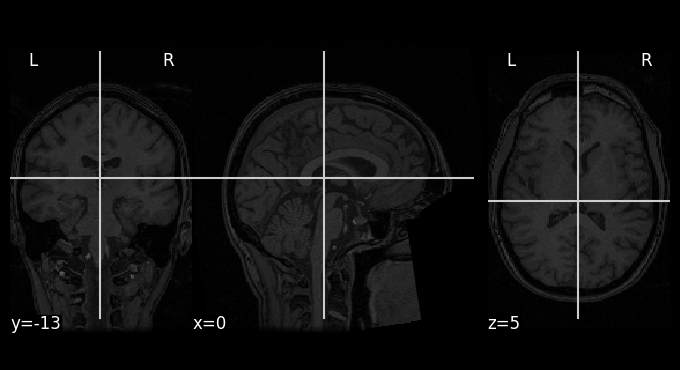

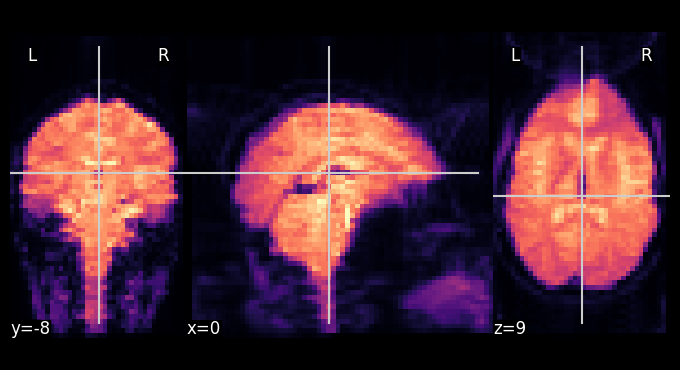

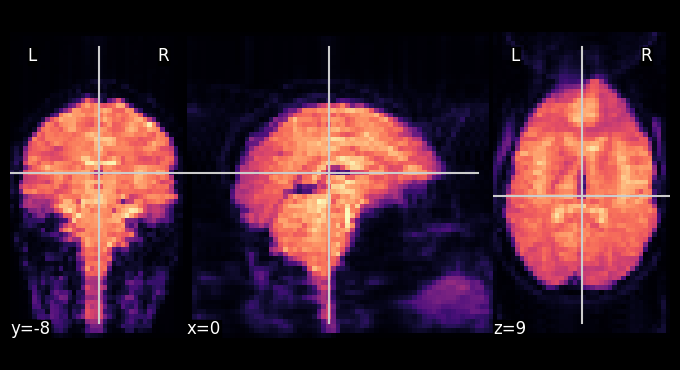

In [3]:
import os
from bids import BIDSLayout
from nilearn import plotting, image
import nibabel as nib

# Указываем путь к BIDS датасету
bids_path = "/home/elijah/diploma_data/ds000105-download"

# Инициализируем BIDS Layout
layout = BIDSLayout(bids_path)

# Получаем список всех NIfTI файлов в датасете
nifti_files = layout.get(extension='nii.gz', return_type='file')

# Визуализируем каждый NIfTI файл
for nifti_file in nifti_files[:3]:
    # Load the nifti file using nibabel
    img = nib.load(nifti_file)
    
    # Check if the image is 4D (e.g., fMRI data)
    if len(img.shape) == 4:
        func_image_mean = image.mean_img(img)
        plotting.plot_epi(func_image_mean, cmap='magma')
    else:
        plotting.plot_anat(img)

    plotting.show()


In [4]:
img = nib.load(nifti_file)

In [5]:
img.get_fdata().shape

(40, 64, 64, 121)

/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/nilearn/image/resampling.py:591: UserWarning: Casting data from int32 to float32
  warnings.warn(f"Casting data from {data.dtype.name} to {aux}")



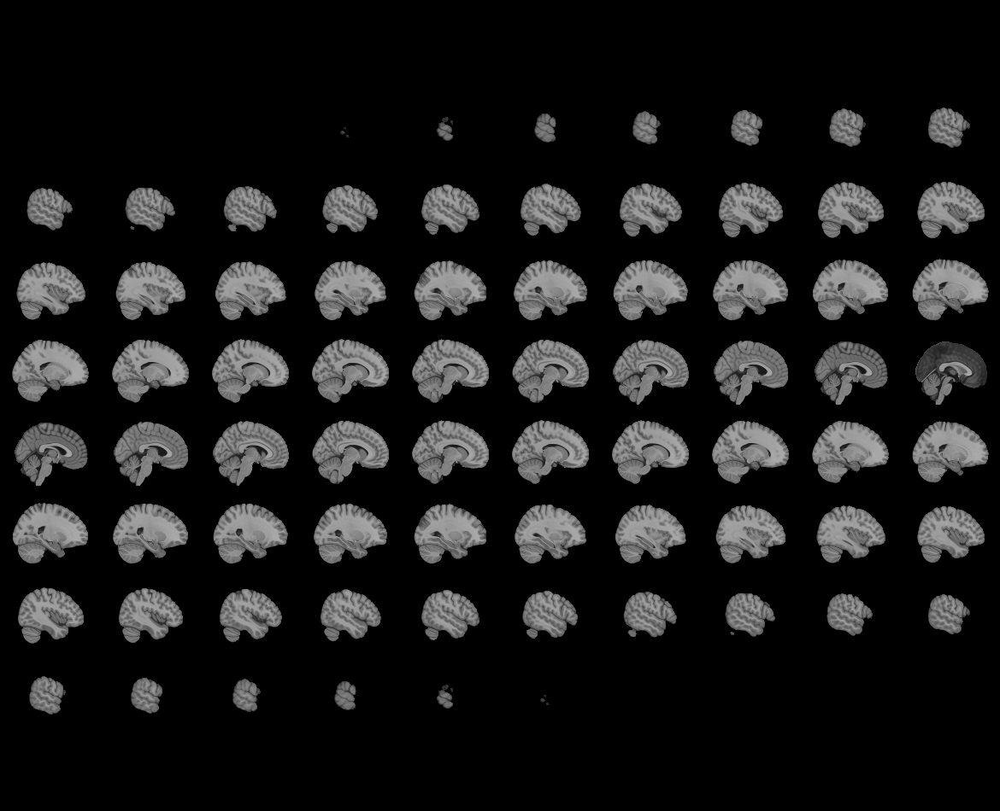
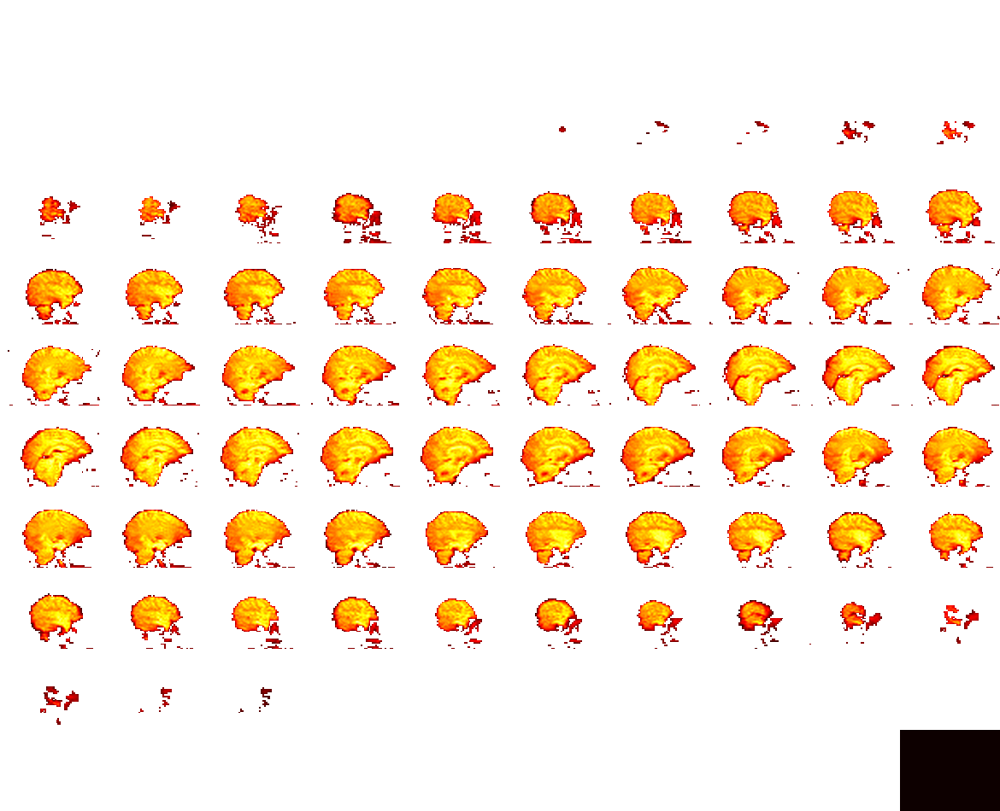

In [6]:
plotting.view_img(img.slicer[...,0], threshold='auto',
                  cmap='cold_hot', )

In [7]:
def merge_df(df):
    merged_data = []

    # Iterate through the DataFrame to merge rows
    current_trial_type = None
    current_duration_sum = 0
    current_start = None
    
    for _, row in df.iterrows():
        if row['trial_type'] == current_trial_type:
            # If the trial_type is the same as the previous, add to the duration sum
            current_duration_sum += row['duration']
        else:
            # If the trial_type changes, save the previous segment (if it exists) and start a new segment
            if current_trial_type is not None:
                merged_data.append([current_start, current_duration_sum, current_trial_type])
            current_trial_type = row['trial_type']
            current_duration_sum = row['duration']
            current_start = row['onset']
    
    # Don't forget to add the last segment
    merged_data.append([current_start, current_duration_sum, current_trial_type])
    
    # Convert the merged data back into a DataFrame
    merged_df = pd.DataFrame(merged_data, columns=['onset', 'duration', 'trial_type'])
    return merged_df

In [8]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import pandas as pd

In [9]:
from nilearn.image import clean_img
import random
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import nibabel as nib
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

class FMRIEventsDataset(Dataset):
    def __init__(self, layout, tr=None, label_encoder=None, time_shift=3, preprocess=True, mode='train', test_size=0.2, augmentation=False):
        self.layout = layout
        self.anatomics = {} # save anat images to this variable
        self.tr = tr if tr is not None else self.layout.get_tr()
        self.label_encoder = LabelEncoder() if label_encoder is None else label_encoder
        self.time_shift = time_shift
        self.preprocess = preprocess
        self.augmentation = augmentation
        self.mode = mode

        self.samples = []
        self.unique_labels = set()
        self.subject_id_to_int = {}
        self._prepare_samples()

        if label_encoder is None:
            self.label_encoder.fit(list(self.unique_labels))

        self.train_samples, self.test_samples = train_test_split(self.samples, test_size=test_size, random_state=42)
        
        if mode == 'train':
            self.samples = self.train_samples
        elif mode == 'test':
            self.samples = self.test_samples

    def _prepare_samples(self):
        subjects = self.layout.get_subjects()
        subject_int_key = 0
        
        for subject in subjects:
            self.subject_id_to_int[subject] = subject_int_key
            subject_int_key += 1
            
            anat_files = self.layout.get(subject=subject, suffix='T1w', extension='nii.gz', return_type='file')
            if anat_files:
                # Assuming there's only one anat file per subject for simplicity
                self.anatomics[subject] = anat_files[0]
                
            
            func_files = self.layout.get(subject=subject, suffix='bold', extension='nii.gz', return_type='file')
            events_files = self.layout.get(subject=subject, suffix='events', extension='tsv', return_type='file')
            
            # Ensure func_files and events_files have a 1:1 correspondence
            if len(func_files) != len(events_files):
                raise ValueError("Mismatch between the number of functional and events files for subject: {}".format(subject))
            
            for func_file, event_file in zip(func_files, events_files):
                events_df = pd.read_csv(event_file, sep='\t')
                for _, event in events_df.iterrows():
                    onset, duration, trial_type = event["onset"], event["duration"], event["trial_type"]
                    onset_adjusted = onset + self.time_shift
                    self.unique_labels.add(trial_type)
                    self.samples.append((func_file, onset_adjusted, duration, trial_type))

    def preprocess_img(self, img_data):
        # Placeholder for preprocessing logic, e.g., nilearn.image.clean_img
        clean_data = clean_img(img_data)  # You can customize this with more specific options
        return clean_data.get_fdata()

    def augment_img(self, img_data):
        # Placeholder for augmentation logic
        # For example, randomly flipping the image along an axis
        if random.random() > 0.5:  # Example condition for a random flip
            img_data = np.flip(img_data, axis=random.choice([0, 1, 2]))
        # Add more augmentations as needed
        return img_data

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        func_file, onset, duration, trial_type = self.samples[idx]
        try:
            subject_id = func_file.split("/")[-3].removeprefix('sub-')
            subject_int = self.subject_id_to_int[subject_id]
            func_img = nib.load(func_file)
        except Exception as e:
            print(f"Error loading file {func_file}: {e}")
            return None
        
        affine = func_img.affine
        onset_volume_idx = min(int(onset // self.tr), func_img.get_fdata().shape[-1])
        func_img_data = func_img.slicer[..., onset_volume_idx:onset_volume_idx+1]
        
        if self.preprocess:
            func_img_data = self.preprocess_img(func_img_data)
        else:
            func_img_data = func_img_data.get_fdata()

        func_img_data = func_img_data[...,-1]

        if self.augmentation and self.mode == 'train':
            func_img_data = self.augment_img(func_img_data)
            
        volume_tensor = torch.tensor(func_img_data.copy(), dtype=torch.float32).unsqueeze(0)  # Add channel dimension
        label_tensor = torch.tensor(self.label_encoder.transform([trial_type]), dtype=torch.long)

        return volume_tensor, label_tensor.squeeze(), subject_int, affine


In [10]:
def custom_collate_fn(batch):
    # Handling variable-length sequences of volumes
    event_volumes, labels = zip(*batch)
    
    # Padding sequences to the longest sequence in the batch
    padded_event_volumes = [pad_sequence([torch.tensor(vol) for vol in seq], batch_first=True) for seq in event_volumes]
    
    # Stacking labels
    labels_tensor = torch.stack(labels)
    
    return padded_event_volumes, labels_tensor

In [11]:
from torch.utils.data import random_split
dataset = FMRIEventsDataset(layout, layout.get_tr())

train_set_size = int(len(dataset) * 0.8)
valid_set_size = len(dataset) - train_set_size

# split the train set into two
seed = torch.Generator().manual_seed(42)

train_set, valid_set = random_split(dataset, [train_set_size, valid_set_size], generator=seed)

train_loader = DataLoader(train_set, batch_size=32, shuffle=True, pin_memory=True, num_workers=11)
test_loader = DataLoader(valid_set, batch_size=32, shuffle=True, pin_memory=True, num_workers=11)

In [12]:
from nilearn import datasets

In [13]:
import torch
from torch import nn
import pytorch_lightning as pl
import torch.nn.functional as F
import torchmetrics

class FMRIVolumeClassifier(pl.LightningModule):
    def __init__(self, num_subjects, num_voxels=163840, d_model=512, num_classes=10, input_shape=(1, 40, 64, 64)):
        super().__init__()
        self.save_hyperparameters()

        
        self.embedding = nn.Embedding(num_embeddings=num_subjects, embedding_dim=d_model)
        
        self.conv3d = nn.Sequential(
            nn.Conv3d(input_shape[0], 32, kernel_size=3, padding=1),
            nn.LeakyReLU(0.01),
            nn.MaxPool3d(2),
            nn.BatchNorm3d(32),
            nn.Conv3d(32, 64, kernel_size=3, padding=1),
            nn.LeakyReLU(0.01),
            nn.MaxPool3d(2),
            nn.BatchNorm3d(64),
        )
        
        conv3d_output_size = self._get_conv3d_output_size(input_shape)
        self.fc_input_size = conv3d_output_size * 64
        
        self.encoder = nn.Sequential(
            nn.Linear(self.fc_input_size, d_model),
            nn.Dropout(0.2),
            nn.LeakyReLU(0.01),
        )

        self.fc2 = nn.Linear(d_model + d_model, d_model)
        self.classifier = nn.Linear(d_model, num_classes)
        
        self.accuracy = torchmetrics.Accuracy(task='multiclass', num_classes=num_classes)

    def _get_conv3d_output_size(self, input_shape):
        with torch.no_grad():
            dummy_input = torch.zeros(1, *input_shape)
            output = self.conv3d(dummy_input)
            return torch.tensor(output.shape[2:]).prod().item()

    def forward(self, x, subject_id):
        x = self.conv3d(x)
        x = x.view(x.size(0), -1)
        x = self.encoder(x)
        emb = self.embedding(subject_id)
        encoded = torch.cat((emb, x), dim=1)
        encoded = self.fc2(encoded)
        logits = self.classifier(encoded)
        return logits

    def training_step(self, batch, batch_idx):
        x, y, subject_id, _ = batch
        logits = self.forward(x, subject_id)
        loss = F.cross_entropy(logits, y)
        acc = self.accuracy(logits, y)
        self.log('train_loss', loss, prog_bar=True, on_step=True, on_epoch=True)
        self.log('train_acc', acc, prog_bar=True, on_step=True, on_epoch=True)  # Log accuracy on epoch for better performance
        return loss

    def validation_step(self, batch, batch_idx):
        x, y, subject_id, _ = batch
        logits = self.forward(x, subject_id)
        loss = F.cross_entropy(logits, y)
        acc = self.accuracy(logits, y)
        self.log('test_loss', loss, prog_bar=True, on_epoch=True)
        self.log('test_acc', acc, prog_bar=True, on_epoch=True)

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=9e-6)
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.9, )
        return [optimizer], [scheduler]


In [14]:
version = 0

In [15]:
dataset.unique_labels

{'bottle', 'cat', 'chair', 'face', 'house', 'scissors', 'scrambledpix', 'shoe'}

In [16]:
import warnings
warnings.filterwarnings("ignore")

In [27]:
from pytorch_lightning import Trainer
from pytorch_lightning.loggers import TensorBoardLogger

shift = 3

dataset = FMRIEventsDataset(layout, layout.get_tr(), time_shift=shift, preprocess=True, augmentation=False)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True, pin_memory=True, num_workers=11)
version+=1
n_classes = len(dataset.unique_labels)
model = FMRIVolumeClassifier(num_classes=n_classes,
                               num_subjects=len(dataset.subject_id_to_int),
                               d_model=128,
                              )
# default logger used by trainer (if tensorboard is installed)
logger = TensorBoardLogger(save_dir=os.getcwd(), name=f"lightning_logs_{shift}",version=f"shift_{shift}")
# Initialize a trainer
trainer = Trainer(max_epochs=90,
                  gradient_clip_val=1.5,
                  log_every_n_steps=1,
                  default_root_dir="my_checkopoints/fmri_3d_conv/",
                  enable_checkpointing=True)  # Adjust max_epochs as needed, set gpus=0 for CPU

# Train the model
trainer.fit(model, train_loader, test_loader)
    

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type               | Params
--------------------------------------------------
0 | embedding  | Embedding          | 768   
1 | conv3d     | Sequential         | 56.4 K
2 | encoder    | Sequential         | 21.0 M
3 | fc2        | Linear             | 32.9 K
4 | classifier | Linear             | 1.0 K 
5 | accuracy   | MulticlassAccuracy | 0     
--------------------------------------------------
21.1 M    Trainable params
0         Non-trainable params
21.1 M    Total params
84.251    Total estimated model params size (MB)


Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

`Trainer.fit` stopped: `max_epochs=90` reached.


In [28]:
torch.save(model.state_dict(), 'model_conv3d_V1_0687.pt')

In [17]:
shift = 3

dataset = FMRIEventsDataset(layout, layout.get_tr(), time_shift=shift, preprocess=True, augmentation=False)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True, pin_memory=True, num_workers=11)
version+=1
n_classes = len(dataset.unique_labels)


model = FMRIVolumeClassifier(num_classes=n_classes,
                               num_subjects=len(dataset.subject_id_to_int),
                               d_model=128,
                              )


In [18]:
model.load_state_dict(torch.load('model_conv3d_V1_0687.pt'))

<All keys matched successfully>

In [19]:
batch = next(iter(train_loader))

In [20]:
# !pip install shap

In [31]:
class ModelWrapper(nn.Module):
    def __init__(self, original_model):
        super().__init__()
        self.original_model = original_model
    
    def forward(self, combined_input):
        # Assuming the last dimension is used to store subject_id which is appended to fmri_data
        fmri_data = combined_input[:, :-1].reshape(len(combined_input), 1, 40, 64, 64)
        subject_id = combined_input[:, -1].long() # Adjust slicing as needed
        return self.original_model(fmri_data, subject_id)

wrapper = ModelWrapper(model).cuda()


data_comb = torch.stack([torch.cat((batch[0][i].reshape(-1), torch.as_tensor([batch[2][i]])))  for i in range(len(batch[0]))]).cuda()
data_comb_interpret = torch.stack([torch.cat((batch[0][i].reshape(-1), torch.as_tensor([batch[2][i]])))  for i in range(len(batch[0]))]).cuda()


from shap import DeepExplainer

explainer = DeepExplainer(wrapper, data_comb)

shap_values = explainer.shap_values(data_comb_interpret, check_additivity=False)

OutOfMemoryError: CUDA out of memory. Tried to allocate 1.25 GiB. GPU 0 has a total capacity of 7.77 GiB of which 348.38 MiB is free. Including non-PyTorch memory, this process has 6.78 GiB memory in use. Of the allocated memory 6.42 GiB is allocated by PyTorch, and 149.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [34]:
!pip install gradio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 30.4 MB/s eta 0:00:00m eta 0:00:010:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 KB 1.4 MB/s eta 0:00:0031m350.6 MB/s eta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 30.1 MB/s eta 0:00:00m eta 0:00:010:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 407.9/407.9 KB 11.2 MB/s eta 0:00:000:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.2/47.2 KB 1.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.9/91.9 KB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 KB 1.8 MB/s eta 0:00:0031m430.8 MB/s eta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.6/313.6 KB 6.7 MB/s eta 0:00:000:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.1/141.1 KB 2.9 MB/s eta 0:00:001m405.5 MB/s eta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 KB 3.4 MB/s eta 0:00:001m488.0 MB/s eta 0:00:01
   

In [55]:
import numpy as np
import nibabel as nib
from nilearn import plotting
import gradio as gr

def visualize_brain(subject, class_name):
    
    # Assuming batch, shap_values, and other data variables are already loaded and accessible
    class_idx = dataset.label_encoder.transform([class_name])[0]
    # Example data processing
    subj_image = batch[0][subject].reshape(40, 64, 64).numpy()
    subj_affine = batch[3][subject]

    shap_as_inp = shap_values[subject, :-1, ...].reshape(163840, 8)[..., class_idx]
    shap_values_for_class = shap_as_inp.reshape(40, 64, 64)
    sub_num = str(batch[2][subject].long().item())
    print(sub_num , type(sub_num))
    bg_nifti_img = nib.load(dataset.anatomics[sub_num])
    shap_nifti_img = nib.Nifti1Image(shap_values_for_class, subj_affine)

    view = plotting.view_img(shap_nifti_img, threshold='auto', bg_img=bg_nifti_img, cmap='cold_hot')

    # Get the HTML code from the viewer object
    html_view = view.get_iframe()  # or view.get_html() depending on nilearn version
    return html_view



In [56]:
mapping = '\n'.join([f"{i}:{label}"for i, label in enumerate(dataset.label_encoder.classes_)])
info = f"Class mapping:\n {mapping}"
subject_slider = gr.Slider(minimum=0, maximum=len(batch[0]), step=1, label="Subject Number")  # Adjust the range as necessary
class_picker = gr.Dropdown(dataset.label_encoder.classes_.tolist())
# class_slider = gr.Slider(minimum=0, maximum=n_classes, step=1, label="Class Index", info=info)  # Adjust the range as necessary

iface = gr.Interface(fn=visualize_brain, 
                     inputs=[subject_slider, class_picker], 
                     outputs="html",
                     live=True)

iface.launch(share=True,)


Running on local URL:  http://127.0.0.1:7867
Running on public URL: https://27e86332603f4ebcb1.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


5 <class 'str'>
3 <class 'str'>
5 <class 'str'>
5 <class 'str'>
5 <class 'str'>
5 <class 'str'>


Traceback (most recent call last):
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/sklearn/utils/_encode.py", line 225, in _encode
    return _map_to_integer(values, uniques)
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/sklearn/utils/_encode.py", line 165, in _map_to_integer
    return np.array([table[v] for v in values])
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/sklearn/utils/_encode.py", line 165, in <listcomp>
    return np.array([table[v] for v in values])
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/sklearn/utils/_encode.py", line 159, in __missing__
    raise KeyError(key)
KeyError: 'None'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/elijah/.cache/

Error while flagging: field larger than field limit (131072)
Error while flagging: field larger than field limit (131072)
Error while flagging: field larger than field limit (131072)
5 <class 'str'>
5 <class 'str'>
Error while flagging: field larger than field limit (131072)
Error while flagging: field larger than field limit (131072)
5 <class 'str'>
5 <class 'str'>
5 <class 'str'>
3 <class 'str'>
5 <class 'str'>
Error while flagging: field larger than field limit (131072)


Traceback (most recent call last):
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/sklearn/utils/_encode.py", line 225, in _encode
    return _map_to_integer(values, uniques)
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/sklearn/utils/_encode.py", line 165, in _map_to_integer
    return np.array([table[v] for v in values])
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/sklearn/utils/_encode.py", line 165, in <listcomp>
    return np.array([table[v] for v in values])
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/sklearn/utils/_encode.py", line 159, in __missing__
    raise KeyError(key)
KeyError: 'None'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/elijah/.cache/

Error while flagging: field larger than field limit (131072)
Error while flagging: field larger than field limit (131072)


Traceback (most recent call last):
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/sklearn/utils/_encode.py", line 225, in _encode
    return _map_to_integer(values, uniques)
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/sklearn/utils/_encode.py", line 165, in _map_to_integer
    return np.array([table[v] for v in values])
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/sklearn/utils/_encode.py", line 165, in <listcomp>
    return np.array([table[v] for v in values])
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/sklearn/utils/_encode.py", line 159, in __missing__
    raise KeyError(key)
KeyError: 'None'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/elijah/.cache/

5 <class 'str'>
5 <class 'str'>


Traceback (most recent call last):
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/gradio/queueing.py", line 527, in process_events
    response = await route_utils.call_process_api(
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/gradio/route_utils.py", line 261, in call_process_api
    output = await app.get_blocks().process_api(
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/gradio/blocks.py", line 1786, in process_api
    result = await self.call_function(
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/gradio/blocks.py", line 1338, in call_function
    prediction = await anyio.to_thread.run_sync(
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/anyio/to_thread.py", line 5

Error while flagging: field larger than field limit (131072)
5 <class 'str'>
3 <class 'str'>


Traceback (most recent call last):
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/gradio/queueing.py", line 527, in process_events
    response = await route_utils.call_process_api(
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/gradio/route_utils.py", line 261, in call_process_api
    output = await app.get_blocks().process_api(
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/gradio/blocks.py", line 1786, in process_api
    result = await self.call_function(
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/gradio/blocks.py", line 1338, in call_function
    prediction = await anyio.to_thread.run_sync(
  File "/home/elijah/.cache/pypoetry/virtualenvs/eeg-mri-analyzer-C0pNHHSC-py3.10/lib/python3.10/site-packages/anyio/to_thread.py", line 5

array(['bottle', 'cat', 'chair', 'face', 'house', 'scissors',
       'scrambledpix', 'shoe'], dtype='<U12')

In [71]:
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import imageio
import os
from nilearn.image import resample_to_img

nifti_img = nib.Nifti1Image(shap_values_abs,
                                 subj_affine)
background_img = nib.load(dataset.anatomics[id_to_sub[batch[2][subject].long().item()]])


axis = 2  # 0 for sagittal, 1 for coronal, 2 for axial
skip = 2  # Number of slices to skip
color_map = 'cold_hot'  # Color map for the slice images
background_color_map = 'gray'  # Color map for the background image
lower_percentile = 5   # Lower percentile threshold
upper_percentile = 95  # Upper percentile threshold

# Function to resample a slice to match another's affine
def resample_to_affine(source_img, target_img):
    return resample_to_img(source_img, target_img)

# Adjusted save_slice to consider affine alignment and apply two-sided percentile threshold
def save_slice(slice_data, background_slice, index, colormap='gray'):
    fig, ax = plt.subplots(figsize=(5, 5))
    if background_slice is not None:
        ax.imshow(background_slice.T, cmap=background_color_map, origin='lower', interpolation='none')
    
    # Apply a two-sided percentile-based mask to the slice data
    lower_threshold = np.percentile(slice_data, lower_percentile)
    upper_threshold = np.percentile(slice_data, upper_percentile)
    masked_data = np.ma.masked_outside(slice_data, lower_threshold, upper_threshold)

    ax.imshow(masked_data.T, cmap=colormap, origin='lower', interpolation='none', alpha=0.7)  # Change alpha for transparency
    ax.axis('off')
    plt.savefig(f'slice_{index}.png', bbox_inches='tight', pad_inches=0)
    plt.close()

# Resample background image to the main image's space if provided
if background_img is not None:
    resampled_background_img = resample_to_affine(background_img, nifti_img)
    background_data = resampled_background_img.get_fdata()
else:
    background_data = None

# Extract and save slices
data = nifti_img.get_fdata()
slices = range(0, data.shape[axis], skip)

for i in slices:
    slice_data = data.take(indices=i, axis=axis)
    background_slice = background_data.take(indices=i, axis=axis) if background_data is not None else None
    save_slice(slice_data, background_slice, i, colormap=color_map)

# Create the GIF
images = [imageio.imread(f'slice_{i}.png') for i in slices]
imageio.mimsave('brain_slices.gif', images, duration=0.3)  # Adjust the frame duration as needed

# Clean up the generated images
for i in slices:
    os.remove(f'slice_{i}.png')


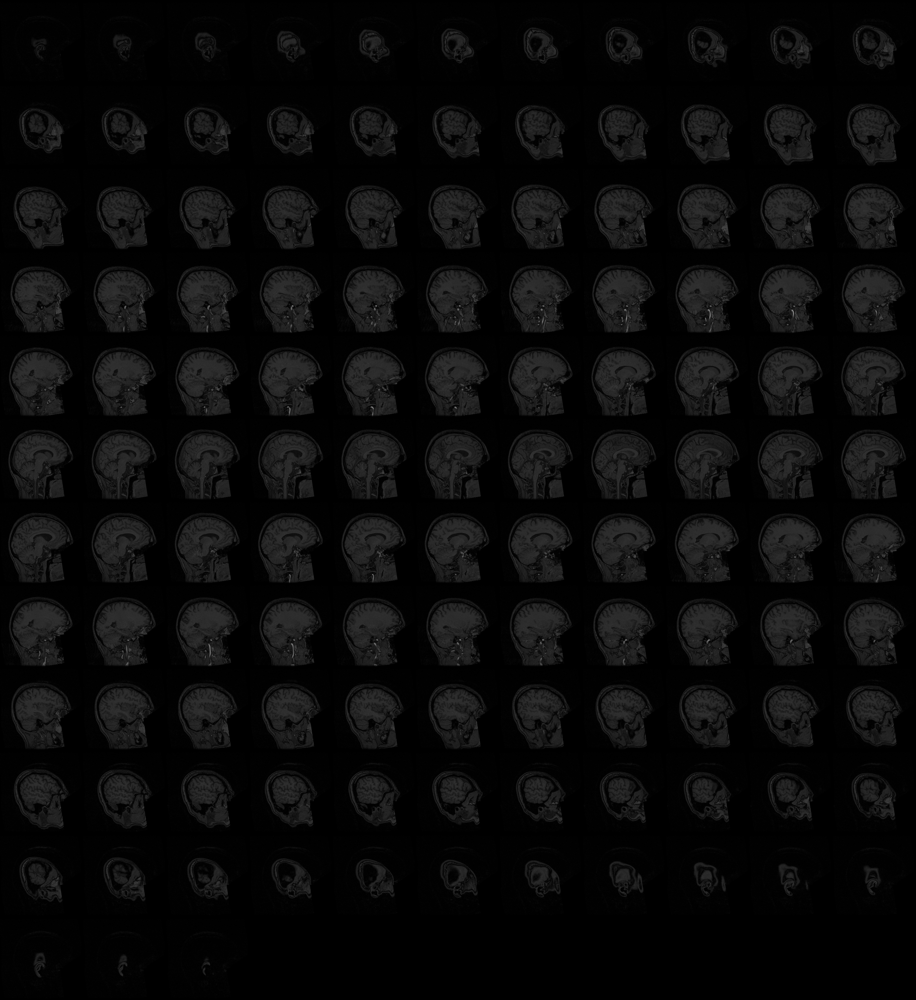
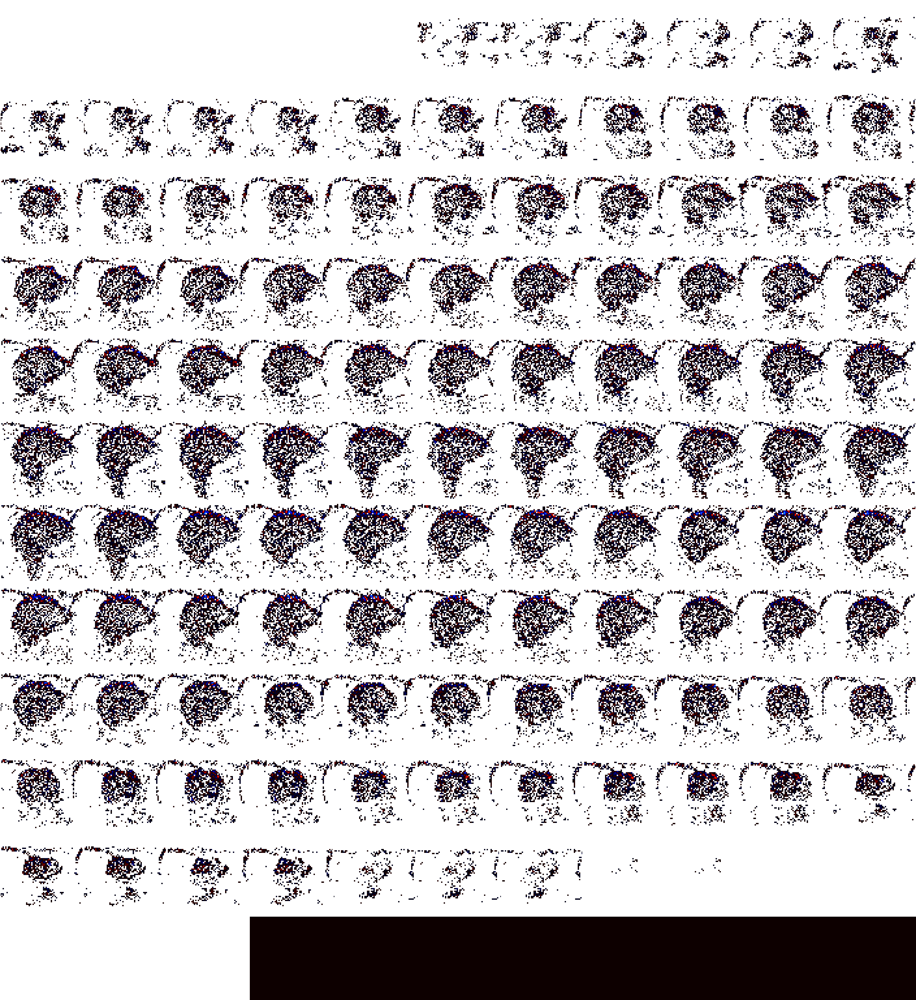

In [72]:
import numpy as np
import nibabel as nib
from nilearn import plotting

subject = 10
time = 0
class_index = 1


subj_image = batch[0][subject].reshape(40, 64, 64).numpy()
subj_affine = batch[3][subject]
# subj_affine = np.eye(4)

shap_as_inp = shap_values[subject-10, :-1,...].reshape(163840, 8)[...,0]
shap_values_for_class = shap_as_inp.reshape(40, 64, 64)

bg_nifti_img = nib.load(dataset.anatomics[id_to_sub[batch[2][subject].long().item()]])

# Convert SHAP values to an absolute value to focus on magnitude of impact
shap_values_abs = shap_values_for_class

# Since we want to display these values interactively, let's aggregate them across the depth dimension
# shap_values_aggregated = np.mean(shap_values_abs, axis=0)

# Create a NIfTI-like object; you might need to adjust the affine transformation based on your data specifics
shap_nifti_img = nib.Nifti1Image(shap_values_abs,
                                 subj_affine)


# Display the image interactively
# Adjust the threshold as necessary to highlight the most significant contributions
plotting.view_img(shap_nifti_img, threshold='auto',
                  bg_img=bg_nifti_img,
                  title=f'SHAP values for class {class_index}',
                  cmap='cold_hot', )